In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -qr requirements.txt
!pip install -q roboflow

Cloning into 'yolov5'...
remote: Enumerating objects: 17968, done.
remote: Counting objects: 100% (92/92), done.
remote: Compressing objects: 100% (57/57), done.
remote: Total 17968 (delta 73), reused 35 (delta 35), pack-reused 17876 (from 3)
Receiving objects: 100% (17968/17968), 17.13 MiB | 19.96 MiB/s, done.
Resolving deltas: 100% (12233/12233), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 40.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 131.1/131.1 kB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.9/207.9 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 19.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 84.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 117.8 MB/s eta 0:00:00


In [ ]:
import os
import shutil
import yaml
from roboflow import Roboflow

print("📥 Mengunduh Dataset 1 (Davin)...")
rf1 = Roboflow(api_key="T4PVnCKUou3nMc10Jf4l")
project1 = rf1.workspace("capstone-g9q9l").project("capstonea4")
dataset1 = project1.version(1).download("yolov5")
path1 = dataset1.location

print("\n📥 Mengunduh Dataset 2 (Zaka)...")
rf2 = Roboflow(api_key="xcatdw5aH8O1J7XOsnxu")
project2 = rf2.workspace("comvis-bdowb").project("capstone-counting-parts-dasgi")
dataset2 = project2.version(1).download("yolov5")
path2 = dataset2.location

print("\n⚙️ Menggabungkan kedua dataset menjadi satu...")
combined_dir = "/content/dataset_gabungan"
for split in ['train', 'valid', 'test']:
    os.makedirs(f"{combined_dir}/{split}/images", exist_ok=True)
    os.makedirs(f"{combined_dir}/{split}/labels", exist_ok=True)

import glob
def merge_data(source_dir, target_dir):
    for split in ['train', 'valid', 'test']:

        for img in glob.glob(f"{source_dir}/{split}/images/*.*"):
            shutil.copy(img, f"{target_dir}/{split}/images/")

        for lbl in glob.glob(f"{source_dir}/{split}/labels/*.txt"):
            shutil.copy(lbl, f"{target_dir}/{split}/labels/")

merge_data(path1, combined_dir)
merge_data(path2, combined_dir)

with open(f"{path1}/data.yaml", 'r') as f:
    yaml_config = yaml.safe_load(f)

new_yaml = {
    'train': f"{combined_dir}/train/images",
    'val': f"{combined_dir}/valid/images",
    'test': f"{combined_dir}/test/images",
    'nc': yaml_config['nc'],
    'names': yaml_config['names']
}

with open(f"{combined_dir}/data.yaml", 'w') as f:
    yaml.dump(new_yaml, f)

total_train = len(os.listdir(f"{combined_dir}/train/images"))
print(f"\n✅ PENGGABUNGAN SUKSES! Total gambar train sekarang: {total_train} gambar")
print(f"Folder gabungan tersimpan di: {combined_dir}")

📥 Mengunduh Dataset 1 (Davin)...
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to capstoneA4-1 in yolov5pytorch:: 100%|██████████| 401/401 [00:00<00:00, 2610.95it/s]



📥 Mengunduh Dataset 2 (Zaka)...
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to capstone-counting-parts-1 in yolov5pytorch:: 100%|██████████| 209/209 [00:00<00:00, 6789.16it/s]


⚙️ Menggabungkan kedua dataset menjadi satu...

✅ PENGGABUNGAN SUKSES! Total gambar train sekarang: 302 gambar
Folder gabungan tersimpan di: /content/dataset_gabungan


In [ ]:
import yaml

combined_dir = "/content/dataset_gabungan"
yaml_path = f"{combined_dir}/data.yaml"

with open(yaml_path, 'r') as f:
    yaml_config = yaml.safe_load(f)

yaml_config['val'] = f"{combined_dir}/train/images"

with open(yaml_path, 'w') as f:
    yaml.dump(yaml_config, f)

print("File data.yaml berhasil diupdate! Folder 'val' sekarang mengarah ke folder 'train'.")

File data.yaml berhasil diupdate! Folder 'val' sekarang mengarah ke folder 'train'.


In [ ]:
!python train.py \
  --img 640 \
  --batch 16 \
  --epochs 150 \
  --data /content/dataset_gabungan/data.yaml \
  --weights yolov5s.pt \
  --name model_epson_gabungan \
  --cache

Streaming output truncated to the last 5000 lines.
                   all        302       7256      0.956      0.916       0.97       0.57

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
  0% 0/19 [00:00<?, ?it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
     34/149      4.32G    0.04437      0.111          0        611        640:   5% 1/19 [00:00<00:03,  4.59it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
     34/149      4.32G    0.04628     0.1138          0        608        640:  11% 2/19 [00:00<00:04,  3.75it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` inste

In [ ]:
!python export.py \
  --weights runs/train/model_epson_gabungan/weights/best.pt \
  --include onnx \
  --img 640 \
  --simplify

export: data=data/coco128.yaml, weights=['runs/train/model_epson_gabungan/weights/best.pt'], imgsz=[640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, per_tensor=False, dynamic=False, cache=, simplify=True, mlmodel=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['onnx']
YOLOv5 🚀 v7.0-484-g70b964b6 Python-3.12.13 torch-2.10.0+cu128 CPU

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from runs/train/model_epson_gabungan/weights/best.pt with output shape (1, 25200, 6) (13.7 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0', 'onnxscript'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 10 packages in 310ms
Prepared 3 packages in 1.20s
Installed 3 packages in 291ms
 + onnx==1.21.0
 + onnx-ir==0.2.1
 + onnxscript==0.7.0

requirements

In [ ]:
!python detect.py \
  --weights runs/train/model_epson_gabungan/weights/best.pt \
  --img 640 \
  --conf 0.4 \
  --source /content/test_baru \
  --save-txt

import glob
import os
from IPython.display import Image, display

list_of_dirs = glob.glob('runs/detect/exp*')
latest_dir = max(list_of_dirs, key=os.path.getctime)

print(f"\n📂 Menampilkan hasil dari folder: {latest_dir}\n")

for imageName in glob.glob(f'{latest_dir}/*.jpg'):
    display(Image(filename=imageName))

    base_name = os.path.basename(imageName)
    txt_name = os.path.splitext(base_name)[0] + '.txt'
    txt_path = os.path.join(latest_dir, 'labels', txt_name)

    total_spring = 0
    if os.path.exists(txt_path):
        with open(txt_path, 'r') as file:
            total_spring = len(file.readlines())

    print(f"➡️ HASIL: Ditemukan {total_spring} spring pada gambar {base_name}")
    print("=" * 60 + "\n")

## SAHI


In [ ]:
!pip install -q sahi
print("✅ Library SAHI berhasil diinstal!")

✅ Library SAHI berhasil diinstal!


YOLOv5 🚀 v7.0-484-g70b964b6 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)

Fusing layers... 
Model summary: 214 layers, 7022326 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 


🚀 Memproses 14 gambar untuk komparasi...

Performing prediction on 8 slices.


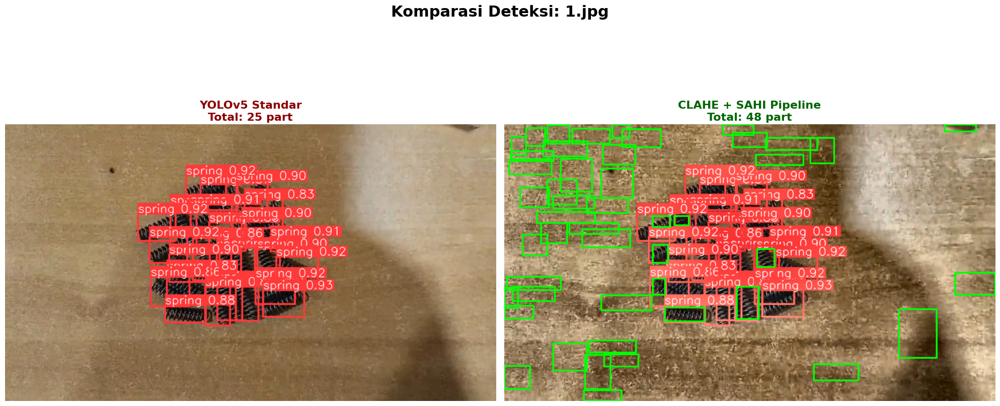

✅ 1.jpg Selesai: Standar (25) vs Enhanced (48)
--------------------------------------------------------------------------------
Performing prediction on 8 slices.


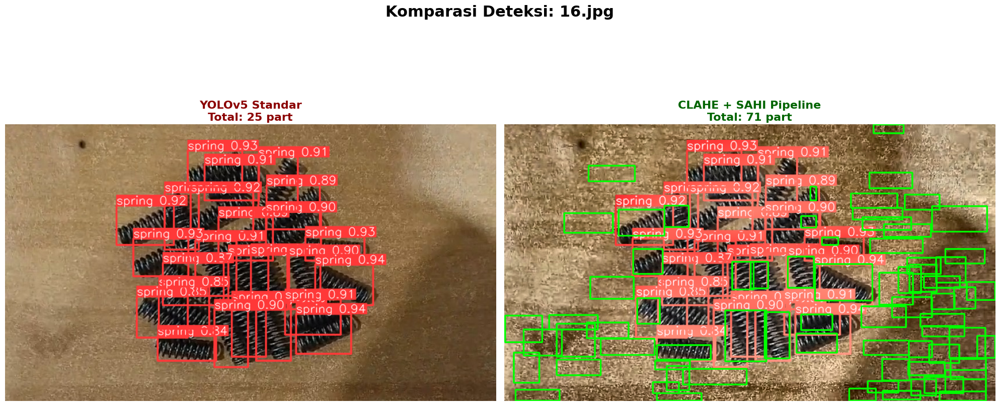

✅ 16.jpg Selesai: Standar (25) vs Enhanced (71)
--------------------------------------------------------------------------------
Performing prediction on 8 slices.


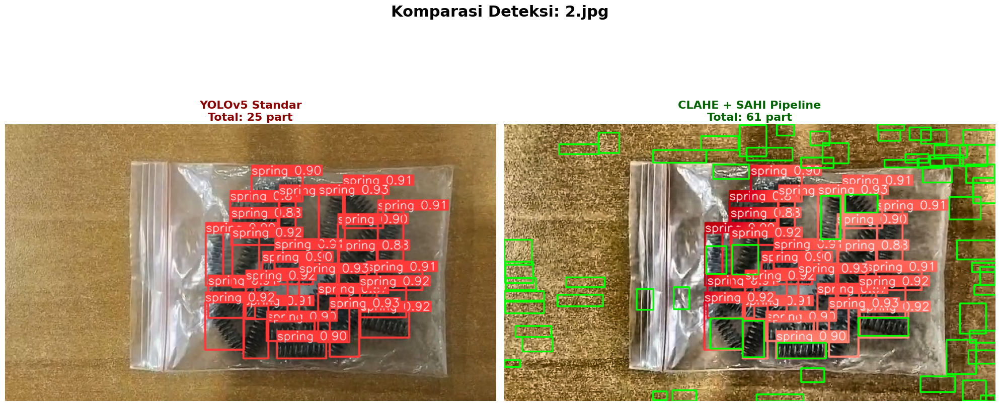

✅ 2.jpg Selesai: Standar (25) vs Enhanced (61)
--------------------------------------------------------------------------------
Performing prediction on 8 slices.


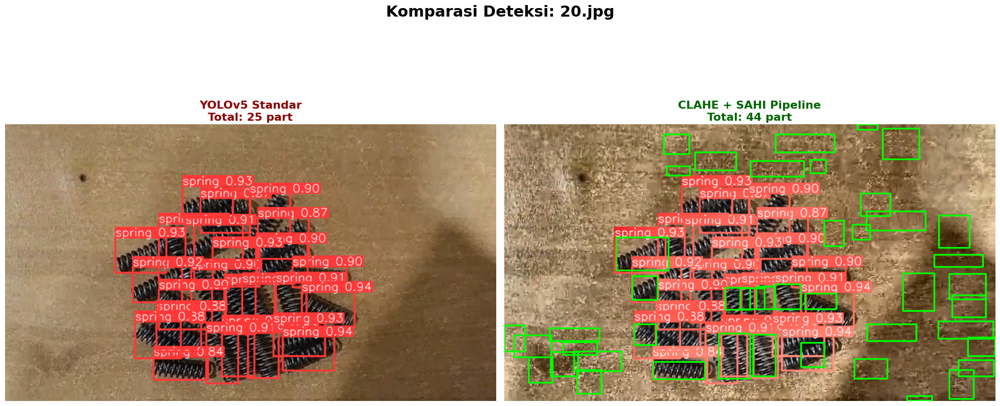

✅ 20.jpg Selesai: Standar (25) vs Enhanced (44)
--------------------------------------------------------------------------------
Performing prediction on 30 slices.


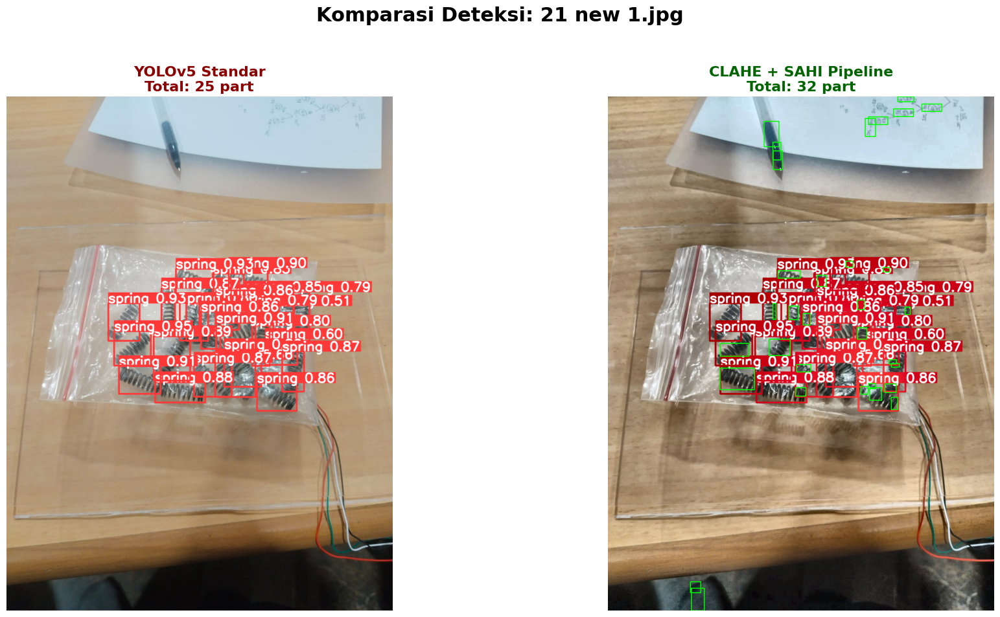

✅ 21 new 1.jpg Selesai: Standar (25) vs Enhanced (32)
--------------------------------------------------------------------------------
Performing prediction on 30 slices.


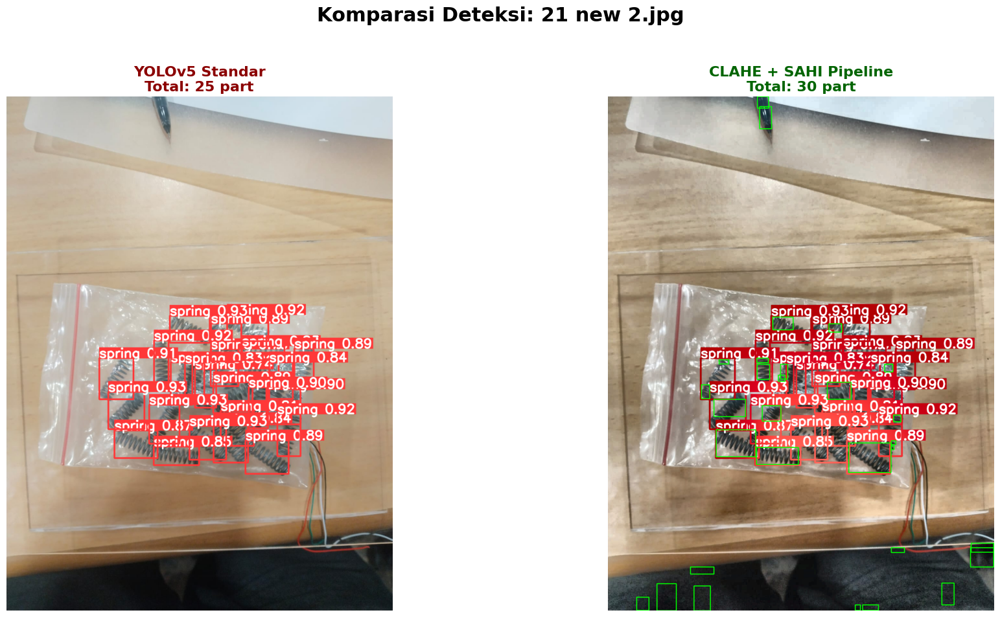

✅ 21 new 2.jpg Selesai: Standar (25) vs Enhanced (30)
--------------------------------------------------------------------------------
Performing prediction on 8 slices.


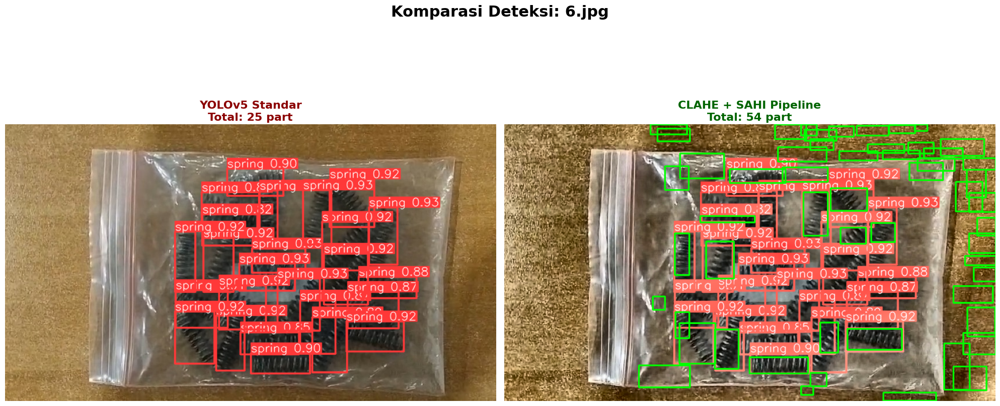

✅ 6.jpg Selesai: Standar (25) vs Enhanced (54)
--------------------------------------------------------------------------------
Performing prediction on 8 slices.


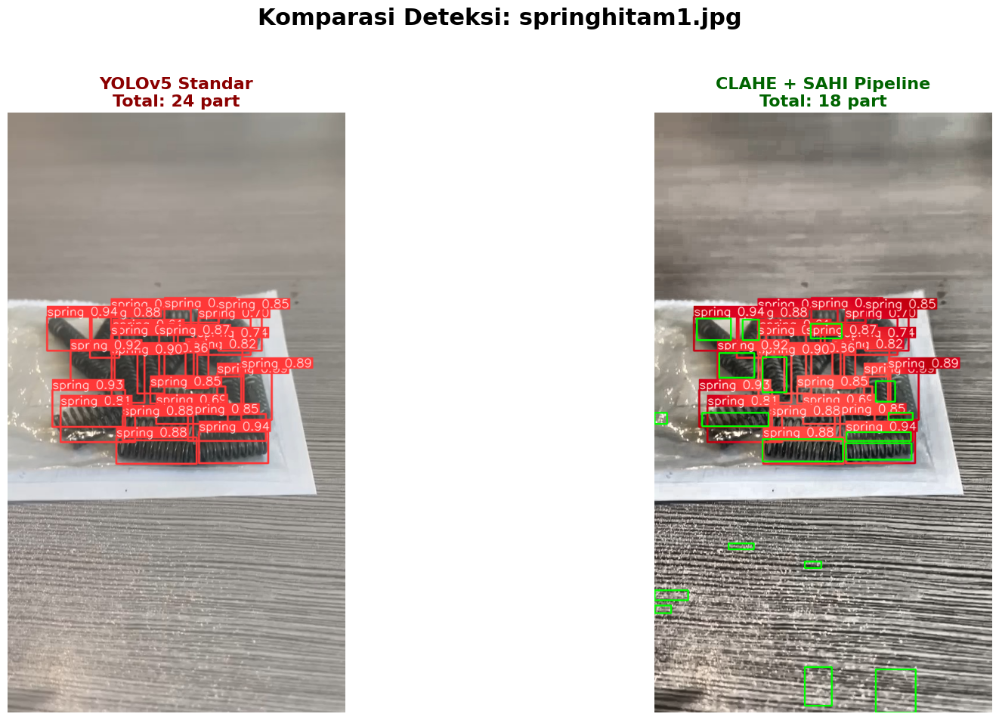

✅ springhitam1.jpg Selesai: Standar (24) vs Enhanced (18)
--------------------------------------------------------------------------------
Performing prediction on 8 slices.


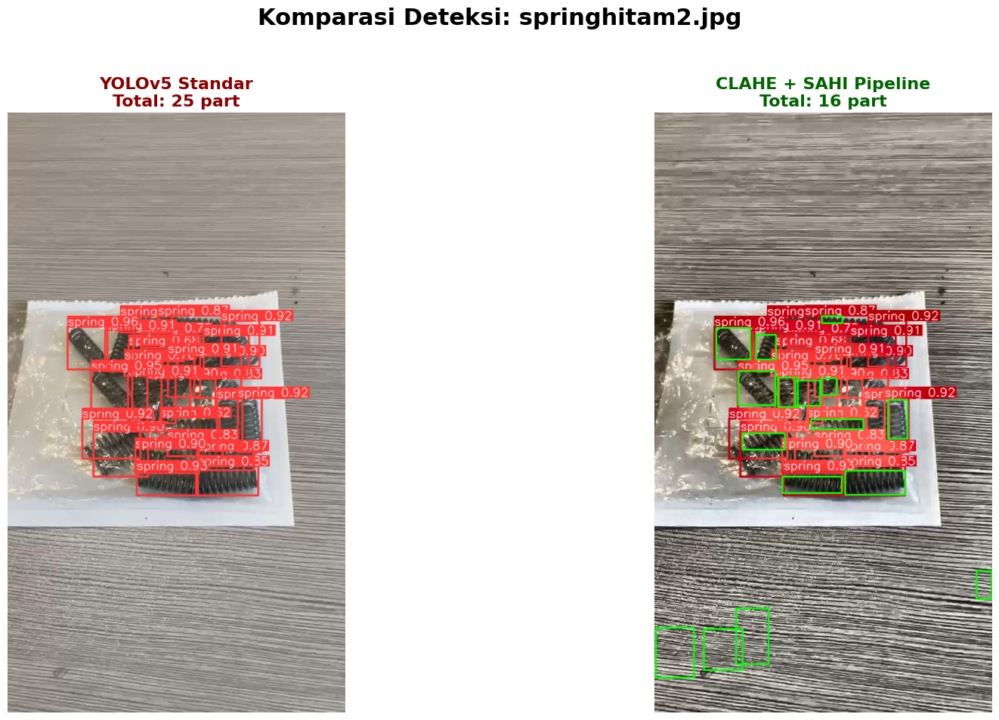

✅ springhitam2.jpg Selesai: Standar (25) vs Enhanced (16)
--------------------------------------------------------------------------------
Performing prediction on 8 slices.


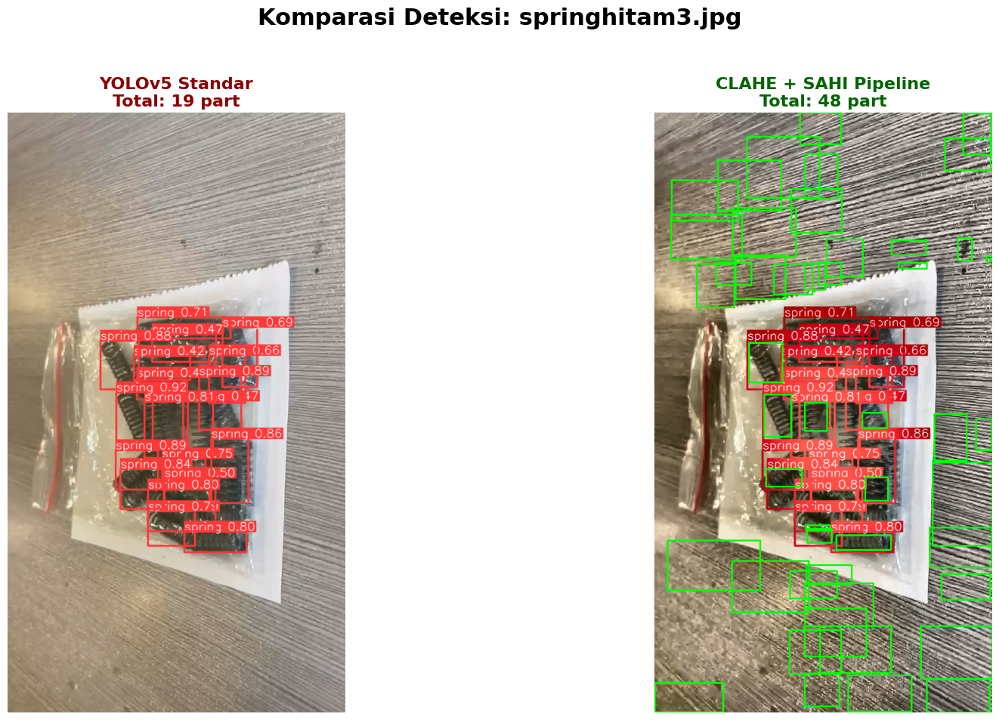

✅ springhitam3.jpg Selesai: Standar (19) vs Enhanced (48)
--------------------------------------------------------------------------------
Performing prediction on 8 slices.


In [ ]:
%matplotlib inline
import os, cv2, torch, warnings
import matplotlib.pyplot as plt
from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction

warnings.filterwarnings("ignore")
test_dir = '/content/test_baru'
weights_path = '/content/yolov5/runs/train/model_epson_gabungan/weights/best.pt'

if not hasattr(torch, '_patched_for_yolo'):
    _original_load = torch.load
    torch.load = lambda *a, **k: _original_load(*a, **{**k, 'weights_only': False})
    torch._patched_for_yolo = True

sahi_model = AutoDetectionModel.from_pretrained(
    model_type='yolov5', model_path=weights_path, confidence_threshold=0.4,
    device="cuda:0" if torch.cuda.is_available() else "cpu"
)
pure_model = torch.hub.load('/content/yolov5', 'custom', path=weights_path, source='local', force_reload=False)
pure_model.conf = 0.4

images = sorted([f for f in os.listdir(test_dir) if f.lower().endswith(('.jpg', '.png', '.jpeg'))])

print(f"🚀 Memproses {len(images)} gambar untuk komparasi...\n")

for img_name in images:
    img_path = os.path.join(test_dir, img_name)
    img_raw = cv2.imread(img_path)
    if img_raw is None: continue
    img_rgb = cv2.cvtColor(img_raw, cv2.COLOR_BGR2RGB)

    res_pure = pure_model(img_rgb)
    img_pure_viz = res_pure.render()[0]
    count_pure = len(res_pure.xyxy[0])

    lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    cl = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8)).apply(l)
    img_enhanced = cv2.cvtColor(cv2.merge((cl, a, b)), cv2.COLOR_LAB2RGB)

    res_sahi = get_sliced_prediction(
        img_enhanced, sahi_model,
        slice_height=320, slice_width=320,
        overlap_height_ratio=0.2, overlap_width_ratio=0.2,
        postprocess_match_threshold=0.5, postprocess_type='NMS'
    )

    img_sahi_viz = img_enhanced.copy()
    count_sahi = len(res_sahi.object_prediction_list)
    for pred in res_sahi.object_prediction_list:
        x1, y1, x2, y2 = map(int, pred.bbox.to_xyxy())
        cv2.rectangle(img_sahi_viz, (x1, y1), (x2, y2), (0, 255, 0), 2)

    plt.figure(figsize=(20, 10))

    plt.subplot(1, 2, 1)
    plt.imshow(img_pure_viz)
    plt.title(f"YOLOv5 Standar\nTotal: {count_pure} part", color='darkred', fontsize=16, fontweight='bold')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(img_sahi_viz)
    plt.title(f"CLAHE + SAHI Pipeline\nTotal: {count_sahi} part", color='darkgreen', fontsize=16, fontweight='bold')
    plt.axis('off')

    plt.suptitle(f"Komparasi Deteksi: {img_name}", fontsize=22, fontweight='bold')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    print(f"✅ {img_name} Selesai: Standar ({count_pure}) vs Enhanced ({count_sahi})")
    print("-"*80)


In [ ]:
# # 0. SETUP & BYPASS (SEMUA LOG DIBUNGKAM)
# !pip install -q sahi yolov5
# import sys, os, cv2, torch, warnings
# import numpy as np
# import matplotlib.pyplot as plt
# from sahi import AutoDetectionModel
# from sahi.predict import get_sliced_prediction

# # Matikan semua peringatan/warning agar gambar tidak tersembunyi
# warnings.filterwarnings("ignore")

# # Bypass Security PyTorch 2.6
# if not hasattr(torch, '_patched_for_yolo'):
#     _original_load = torch.load
#     def patched_load(*args, **kwargs):
#         kwargs['weights_only'] = False
#         return _original_load(*args, **kwargs)
#     torch.load = patched_load
#     torch._patched_for_yolo = True

# # 1. LOAD MODEL
# weights_path = '/content/yolov5/runs/train/model_epson_gabungan/weights/best.pt'
# model = AutoDetectionModel.from_pretrained(
#     model_type='yolov5', model_path=weights_path, confidence_threshold=0.4,
#     device="cuda:0" if torch.cuda.is_available() else "cpu"
# )

# # 2. LOOPING FOTO DI test_baru
# test_dir = '/content/test_baru'
# images = [f for f in os.listdir(test_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]

# for img_name in images:
#     img_path = os.path.join(test_dir, img_name)
#     img_raw = cv2.imread(img_path)
#     img_rgb = cv2.cvtColor(img_raw, cv2.COLOR_BGR2RGB)

#     # A. ORIGINAL (YOLOv5)
#     pure_model = torch.hub.load('/content/yolov5', 'custom', path=weights_path, source='local', force_reload=True)
#     res_pure = pure_model(img_rgb)
#     img_pure = res_pure.render()[0]
#     count_pure = len(res_pure.xyxy[0])

#     # B. CLAHE + SAHI
#     lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)
#     l, a, b = cv2.split(lab)
#     cl = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8)).apply(l)
#     img_enhanced = cv2.cvtColor(cv2.merge((cl, a, b)), cv2.COLOR_LAB2RGB)

#     res_sahi = get_sliced_prediction(
#         img_enhanced, model,
#         slice_height=320, slice_width=320,
#         overlap_height_ratio=0.2, overlap_width_ratio=0.2,
#         postprocess_match_threshold=0.5, postprocess_type='NMS'
#     )

#     # Gambar manual
#     img_sahi = img_enhanced.copy()
#     for pred in res_sahi.object_prediction_list:
#         x1, y1, x2, y2 = map(int, pred.bbox.to_xyxy())
#         cv2.rectangle(img_sahi, (x1, y1), (x2, y2), (0, 255, 0), 3)

#     # 3. PLOT BERSIH
#     fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
#     ax1.imshow(img_pure)
#     ax1.set_title(f"Original YOLOv5: {count_pure} part")
#     ax1.axis('off')
#     ax2.imshow(img_sahi)
#     ax2.set_title(f"CLAHE + SAHI: {len(res_sahi.object_prediction_list)} part")
#     ax2.axis('off')
#     plt.show()
#     plt.close() # Penting agar gambar tidak menumpuk di memori

YOLOv5 🚀 v7.0-484-g70b964b6 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)

Fusing layers... 
Model summary: 214 layers, 7022326 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 


Performing prediction on 8 slices.


YOLOv5 🚀 v7.0-484-g70b964b6 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)

Fusing layers... 
Model summary: 214 layers, 7022326 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 


Performing prediction on 20 slices.


YOLOv5 🚀 v7.0-484-g70b964b6 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)

Fusing layers... 
Model summary: 214 layers, 7022326 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 


Performing prediction on 8 slices.


YOLOv5 🚀 v7.0-484-g70b964b6 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)

Fusing layers... 
Model summary: 214 layers, 7022326 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 


Performing prediction on 8 slices.


YOLOv5 🚀 v7.0-484-g70b964b6 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)

Fusing layers... 
Model summary: 214 layers, 7022326 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 


Performing prediction on 20 slices.


YOLOv5 🚀 v7.0-484-g70b964b6 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)

Fusing layers... 
Model summary: 214 layers, 7022326 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 


Performing prediction on 20 slices.


YOLOv5 🚀 v7.0-484-g70b964b6 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)

Fusing layers... 
Model summary: 214 layers, 7022326 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 


Performing prediction on 8 slices.


YOLOv5 🚀 v7.0-484-g70b964b6 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)

Fusing layers... 
Model summary: 214 layers, 7022326 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 


Performing prediction on 8 slices.


YOLOv5 🚀 v7.0-484-g70b964b6 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)

Fusing layers... 
Model summary: 214 layers, 7022326 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 


Performing prediction on 8 slices.


YOLOv5 🚀 v7.0-484-g70b964b6 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)

Fusing layers... 
Model summary: 214 layers, 7022326 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 


Performing prediction on 8 slices.


YOLOv5 🚀 v7.0-484-g70b964b6 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)

Fusing layers... 
Model summary: 214 layers, 7022326 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 


Performing prediction on 8 slices.


YOLOv5 🚀 v7.0-484-g70b964b6 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)

Fusing layers... 
Model summary: 214 layers, 7022326 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 


Performing prediction on 8 slices.


In [ ]:
%matplotlib inline
import os, cv2, torch, warnings
import matplotlib.pyplot as plt
from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction

warnings.filterwarnings("ignore")
test_dir = '/content/test_baru'
weights_path = '/content/yolov5/runs/train/model_epson_gabungan/weights/best.pt'

if not hasattr(torch, '_patched_for_yolo'):
    _original_load = torch.load
    torch.load = lambda *a, **k: _original_load(*a, **{**k, 'weights_only': False})
    torch._patched_for_yolo = True

sahi_model = AutoDetectionModel.from_pretrained(
    model_type='yolov5', model_path=weights_path, confidence_threshold=0.4,
    device="cuda:0" if torch.cuda.is_available() else "cpu"
)
pure_model = torch.hub.load('/content/yolov5', 'custom', path=weights_path, source='local', force_reload=False)
pure_model.conf = 0.4

images = sorted([f for f in os.listdir(test_dir) if f.lower().endswith(('.jpg', '.png', '.jpeg'))])

print(f"🚀 Memproses {len(images)} gambar untuk komparasi...\n")

for img_name in images:
    img_path = os.path.join(test_dir, img_name)
    img_raw = cv2.imread(img_path)
    if img_raw is None: continue
    img_rgb = cv2.cvtColor(img_raw, cv2.COLOR_BGR2RGB)

    res_pure = pure_model(img_rgb)
    img_pure_viz = res_pure.render()[0]
    count_pure = len(res_pure.xyxy[0])

    lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    cl = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8)).apply(l)
    img_enhanced = cv2.cvtColor(cv2.merge((cl, a, b)), cv2.COLOR_LAB2RGB)

    res_sahi = get_sliced_prediction(
        img_enhanced, sahi_model,
        slice_height=320, slice_width=320,
        overlap_height_ratio=0.2, overlap_width_ratio=0.2,
        postprocess_match_threshold=0.5, postprocess_type='NMS'
    )

    img_sahi_viz = img_enhanced.copy()
    count_sahi = len(res_sahi.object_prediction_list)
    for pred in res_sahi.object_prediction_list:
        x1, y1, x2, y2 = map(int, pred.bbox.to_xyxy())
        cv2.rectangle(img_sahi_viz, (x1, y1), (x2, y2), (0, 255, 0), 2)

    plt.figure(figsize=(20, 10))

    plt.subplot(1, 2, 1)
    plt.imshow(img_pure_viz)
    plt.title(f"YOLOv5 Standar\nTotal: {count_pure} part", color='darkred', fontsize=16, fontweight='bold')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(img_sahi_viz)
    plt.title(f"CLAHE + SAHI Pipeline\nTotal: {count_sahi} part", color='darkgreen', fontsize=16, fontweight='bold')
    plt.axis('off')

    plt.suptitle(f"Komparasi Deteksi: {img_name}", fontsize=22, fontweight='bold')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    print(f"✅ {img_name} Selesai: Standar ({count_pure}) vs Enhanced ({count_sahi})")
    print("-"*80)